In [1]:
suppressMessages(suppressWarnings(library(dplyr)))
suppressMessages(suppressWarnings(library(reshape2)))
suppressMessages(suppressWarnings(library(stringr)))
suppressMessages(suppressWarnings(library(anytime)))
suppressMessages(suppressWarnings(library(tidyverse)))
suppressMessages(suppressWarnings(library(plotly)))
options(repr.plot.width=16, repr.plot.height=7)

# Midterm project: Equity Portfolio Management*

## Data Preparation

Download the historial daily data of the entire 2018 for the 10 stocks

```R
universe = ['IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN', 'FB', 'NFLX', 'TSLA', 'ORCL', 'SAP']
```

For example, to download IBM data, use the following link to go to yahoo finance page. Find the "Download Data" link to download the csv file to you local disk.
https://finance.yahoo.com/quote/IBM/history?period1=1514782800&period2=1546232400&interval=1d&filter=history&frequency=1d

Replace "IBM" with other stock symbol in the above URL, you will be able to download data for other 9 stocks.

You should have 10 csv files on your disk now. IBM.csv, MSFT.csv, etc. We call the 10 stocks "universe" which is the entire stock market you can trade.

In [2]:
universe = c('IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN', 'FB', 'NFLX', 'TSLA', 'ORCL', 'SAP')
universe

[1] "IBM"  "MSFT" "GOOG" "AAPL" "AMZN" "FB"   "NFLX" "TSLA" "ORCL" "SAP"

**First step is to download the stocks. Instead of downloading them manually, we got the downloading link from Yahoo, identified the stock symbol on the parameters being passed and created a more dynamic way of downloading the files.**

In [3]:
start_date = as.character(as.numeric(as.POSIXlt("2018-01-01", format="%Y-%m-%d", origin="1970-01-01")))
end_date = as.character(as.numeric(as.POSIXlt("2018-12-31", format="%Y-%m-%d", origin="1970-01-01")))
for (each_tkt in universe){
    url = paste(
        "https://query1.finance.yahoo.com/v7/finance/download/", each_tkt,
        "?period1=", start_date,
        "&period2=", end_date,
        "&interval=1d&events=history&includeAdjustedClose=true", sep="")
    target_file = paste(each_tkt, ".csv", sep="")
    print(paste("Downloading ", each_tkt, sep=""))
    download.file(url, target_file)
}

[1] "Downloading IBM"
[1] "Downloading MSFT"
[1] "Downloading GOOG"
[1] "Downloading AAPL"
[1] "Downloading AMZN"
[1] "Downloading FB"
[1] "Downloading NFLX"
[1] "Downloading TSLA"
[1] "Downloading ORCL"
[1] "Downloading SAP"


## Retrieve the "Close" and "Adj Close" values for each stock

You will create a dataframe where there are 20 columns for the 10 stocks, each row is the "Close" and "Adj Close" prices for the 10 stocks on each day, in the order of the business days in 2018. Assume all buy/sell on the "Close" prices and there is no transaction cost.

**We also created a dynamic way of reading the files and build the dataframe with all stocks of the universe, with Close and Adj Close values for each stock as columns.**

In [4]:
first_tkt = universe[1]
for (each_tkt in universe){
    if (each_tkt == first_tkt){
        file_name = paste(each_tkt, ".csv", sep="")
        adj_close_colname = paste(each_tkt, "_adj_close", sep="")
        close_colname = paste(each_tkt, "_close", sep="")        
        full_stock = 
            read.csv(file_name) %>%
            transmute(date = Date, !!adj_close_colname := Adj.Close, !!close_colname := Close)       
    } else{
        file_name = paste(each_tkt, ".csv", sep="")
        adj_close_colname = paste(each_tkt, "_adj_close", sep="")
        close_colname = paste(each_tkt, "_close", sep="")
        tmp = 
            read.csv(file_name) %>%
            transmute(date = Date, !!adj_close_colname := Adj.Close, !!close_colname := Close)
        full_stock = full_join(full_stock, tmp, by = "date")
    }
}
# Set date as the name of the row
rownames(full_stock) <- full_stock$date
full_stock = select(full_stock, -date)
head(full_stock, 3)
tail(full_stock, 3)

,IBM_adj_close,IBM_close,MSFT_adj_close,MSFT_close,GOOG_adj_close,GOOG_close,AAPL_adj_close,AAPL_close,AMZN_adj_close,AMZN_close,FB_adj_close,FB_close,NFLX_adj_close,NFLX_close,TSLA_adj_close,TSLA_close,ORCL_adj_close,ORCL_close,SAP_adj_close,SAP_close
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2018-01-02,120.3420,147.4665,81.53024,85.95,1065.00,1065.00,41.13576,43.0650,1189.01,1189.01,181.42,181.42,201.07,201.07,64.106,64.106,43.50795,46.63,105.9143,112.39
2018-01-03,123.6499,151.5201,81.90966,86.35,1082.48,1082.48,41.12860,43.0575,1204.20,1204.20,184.67,184.67,205.05,205.05,63.450,63.450,44.51563,47.71,106.7813,113.31
2018-01-04,126.1542,154.5889,82.63058,87.11,1086.40,1086.40,41.31963,43.2575,1209.59,1209.59,184.33,184.33,205.63,205.63,62.924,62.924,44.95417,48.18,108.4210,115.05


,IBM_adj_close,IBM_close,MSFT_adj_close,MSFT_close,GOOG_adj_close,GOOG_close,AAPL_adj_close,AAPL_close,AMZN_adj_close,AMZN_close,FB_adj_close,FB_close,NFLX_adj_close,NFLX_close,TSLA_adj_close,TSLA_close,ORCL_adj_close,ORCL_close,SAP_adj_close,SAP_close
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2018-12-26,90.83450,106.4914,97.04026,100.56,1039.46,1039.46,38.09573,39.2925,1470.90,1470.90,134.18,134.18,253.67,253.67,65.218,65.218,42.27349,44.59,94.13067,98.38
2018-12-27,92.78345,108.7763,97.63855,101.18,1043.88,1043.88,37.84849,39.0375,1461.64,1461.64,134.52,134.52,255.57,255.57,63.226,63.226,42.63376,44.97,94.71432,98.99
2018-12-28,92.17185,108.0593,96.87620,100.39,1037.08,1037.08,37.86789,39.0575,1478.02,1478.02,133.20,133.20,256.08,256.08,66.774,66.774,42.49154,44.82,94.91525,99.20


**Then we encapsulated these these two steps (downloading and building the Data Frame) on a function, to make it easy to do it going forward.**

In [5]:
retrieve_stock_prices = function(universe, start_date, end_date){
    for (each_tkt in universe){
        url = paste(
            "https://query1.finance.yahoo.com/v7/finance/download/", each_tkt,
            "?period1=", start_date,
            "&period2=", end_date,
            "&interval=1d&events=history&includeAdjustedClose=true", sep="")
        target_file = paste(each_tkt, ".csv", sep="")
        print(paste("Downloading ", each_tkt, sep=""))
        download.file(url, target_file)
        
        if (each_tkt == first_tkt){
            file_name = paste(each_tkt, ".csv", sep="")
            adj_close_colname = paste(each_tkt, "_adj_close", sep="")
            close_colname = paste(each_tkt, "_close", sep="")        
            full_stock = 
                read.csv(file_name) %>%
                transmute(date = Date, !!adj_close_colname := Adj.Close, !!close_colname := Close)       
        } else{
            file_name = paste(each_tkt, ".csv", sep="")
            adj_close_colname = paste(each_tkt, "_adj_close", sep="")
            close_colname = paste(each_tkt, "_close", sep="")
            tmp = 
                read.csv(file_name) %>%
                transmute(date = Date, !!adj_close_colname := Adj.Close, !!close_colname := Close)
            full_stock = full_join(full_stock, tmp, by = "date")
        }
    }
    # Set date as the name of the row
    rownames(full_stock) <- full_stock$date
    full_stock = select(full_stock, -date)
    full_stock    
}

**And let's test the function**

In [6]:
start_date = as.character(as.numeric(as.POSIXlt("2018-01-01", format="%Y-%m-%d", origin="1970-01-01")))
end_date = as.character(as.numeric(as.POSIXlt("2018-12-31", format="%Y-%m-%d", origin="1970-01-01")))
stock_prices = retrieve_stock_prices(universe, start_date, end_date)
tail(stock_prices)

[1] "Downloading IBM"
[1] "Downloading MSFT"
[1] "Downloading GOOG"
[1] "Downloading AAPL"
[1] "Downloading AMZN"
[1] "Downloading FB"
[1] "Downloading NFLX"
[1] "Downloading TSLA"
[1] "Downloading ORCL"
[1] "Downloading SAP"


,IBM_adj_close,IBM_close,MSFT_adj_close,MSFT_close,GOOG_adj_close,GOOG_close,AAPL_adj_close,AAPL_close,AMZN_adj_close,AMZN_close,FB_adj_close,FB_close,NFLX_adj_close,NFLX_close,TSLA_adj_close,TSLA_close,ORCL_adj_close,ORCL_close,SAP_adj_close,SAP_close
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2018-12-20,92.16368,108.0497,97.95702,101.51,1009.41,1009.41,38.01333,39.2075,1460.83,1460.83,133.40,133.40,260.58,260.58,63.076,63.076,43.83778,46.24,95.77638,100.10
2018-12-21,90.46754,106.0612,94.79181,98.23,979.54,979.54,36.53478,37.6825,1377.45,1377.45,124.95,124.95,246.39,246.39,63.954,63.954,41.71415,44.00,91.98743,96.14
2018-12-24,87.71943,102.8394,90.83530,94.13,976.22,976.22,35.58947,36.7075,1343.96,1343.96,124.06,124.06,233.88,233.88,59.078,59.078,40.47220,42.69,90.89667,95.00
2018-12-26,90.83448,106.4914,97.04027,100.56,1039.46,1039.46,38.09574,39.2925,1470.90,1470.90,134.18,134.18,253.67,253.67,65.218,65.218,42.27349,44.59,94.13067,98.38
2018-12-27,92.78346,108.7763,97.63854,101.18,1043.88,1043.88,37.84851,39.0375,1461.64,1461.64,134.52,134.52,255.57,255.57,63.226,63.226,42.63376,44.97,94.71433,98.99
2018-12-28,92.17185,108.0593,96.87622,100.39,1037.08,1037.08,37.86789,39.0575,1478.02,1478.02,133.20,133.20,256.08,256.08,66.774,66.774,42.49155,44.82,94.91525,99.20


## You start to manage 5 million dollars fund on Jan 02, 2018

You have a strategy to manage the fund.

### Step #1
On Jan 02 2018, you split the \\$5m into 5 \\$1m, and use them to buy 5 stocks from the 10 stocks. For example, IBM close price was \\$154.25. With \\$1m, you can buy max 6482 shares with cost \\$999848.5 with \\$151.5 cash left. You decided to spend $1m on each of ['IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN'] respectively and keep the rest cash into a zero-interest cash account. On Jan 02 2018, your mark to market value (MTM) is \\$5m if combining all stocks value and cash. Your holdings of stocks and cach account is your portfolio.

**First, we start the fund by splitting our money among all of the initial stocks we want to pick. We also set what is the initial date of the fund.** 

In [7]:
options(scipen = 999) # Disabling scientific notation
initial_fund = 5000000
initial_date = "2018-01-02"
initial_stocks = c('IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN')
account = data.frame(
    date = character(),
    stock = character(),
    quantity = double(),
    value = double(),
    stringsAsFactors=FALSE
)
for (each_tkt in initial_stocks){
    stock_name = paste(each_tkt, "_close", sep="")
    stock_value = full_stock[initial_date, stock_name]
    max_stock_quantity = 1000000 %/% stock_value
    total_value = stock_value * max_stock_quantity
    initial_fund = initial_fund - total_value
    print(paste(stock_value, max_stock_quantity, total_value, initial_fund, sep=" | ")   )
    account = account %>% 
        add_row(date = initial_date, stock = each_tkt, quantity = max_stock_quantity, value = total_value)
}
account = account %>% 
    add_row(date = initial_date, stock = "CASH", quantity = initial_fund, value = initial_fund)
account
paste("MTM: ", sum(account$value), sep="")

[1] "147.466537 | 6781 | 999970.587397 | 4000029.412603"
[1] "85.949997 | 11634 | 999942.265098 | 3000087.147505"
[1] "1065 | 938 | 998970 | 2001117.147505"
[1] "43.064999 | 23220 | 999969.27678 | 1001147.870725"
[1] "1189.01001 | 841 | 999957.41841 | 1190.45231500035"


date,stock,quantity,value
<chr>,<chr>,<dbl>,<dbl>
2018-01-02,IBM,6781.000,999970.587
2018-01-02,MSFT,11634.000,999942.265
2018-01-02,GOOG,938.000,998970.000
2018-01-02,AAPL,23220.000,999969.277
2018-01-02,AMZN,841.000,999957.418
2018-01-02,CASH,1190.452,1190.452


[1] "MTM: 5000000"

**And again we encapsulate the code on a function to be used later. This function is going to "buy" stocks on a given day based on the cash available and a list of stocks to be bought**

In [8]:
buy_stocks = function(stock_prices, money, stocks, date){
    account = data.frame(
        date = character(),
        stock = character(),
        quantity = double(),
        value = double(),
        stringsAsFactors=FALSE
    )
    fund_split = (money / length(initial_stocks))
    for (each_tkt in stocks){
        stock_name = paste(each_tkt, "_close", sep="")
        stock_value = full_stock[date, stock_name]
        max_stock_quantity =  fund_split %/% stock_value
        total_value = stock_value * max_stock_quantity
        money = money - total_value
        account = account %>% 
            add_row(date = date, stock = each_tkt, quantity = max_stock_quantity, value = total_value)
    }
    account = account %>% 
        add_row(date = date, stock = "CASH", quantity = money, value = money)
    account
}

In [9]:
stock_prices = retrieve_stock_prices(universe, start_date, end_date)
initial_funds = 5000000
initial_stocks = c('IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN')
initial_date = "2018-01-02"
account = buy_stocks(stock_prices, initial_funds, initial_stocks, initial_date)
account
paste("MTM: ", sum(account$value), sep="")

[1] "Downloading IBM"
[1] "Downloading MSFT"
[1] "Downloading GOOG"
[1] "Downloading AAPL"
[1] "Downloading AMZN"
[1] "Downloading FB"
[1] "Downloading NFLX"
[1] "Downloading TSLA"
[1] "Downloading ORCL"
[1] "Downloading SAP"


date,stock,quantity,value
<chr>,<chr>,<dbl>,<dbl>
2018-01-02,IBM,6781.000,999970.587
2018-01-02,MSFT,11634.000,999942.265
2018-01-02,GOOG,938.000,998970.000
2018-01-02,AAPL,23220.000,999969.277
2018-01-02,AMZN,841.000,999957.418
2018-01-02,CASH,1190.452,1190.452


[1] "MTM: 5000000"

**The "opening" of our fund account seems to be working fine.**

## Step #2

Your trading strategy is "5 days rebalancing of buying low". Here is how it works. You keep your portfolio unchanged until 5 days later on Jan 09 2018. Now you want to re-check the market and adjust your portfolio. You will compute the "Adj Close" price changes from Jan 02 to Jan 09, and find the 5 stocks whose "Adj Close" prices dropped the most in terms of percentage. You sell all current holdings on Jan 09 "Close" prices to convert your portfolio to all cash. Then immediately split your cash, including your cash account, to 5 equal parts to buy the 5 stocks that dropped the most from Jan 02 to Jan 09 on 'Adj Close' prices. You always buy the max shares of stock on the "Close" price and keep the rest cash in cash account. Now the portfolio should be different from 5 days ago. This operation is called "rebalancing".

Keep in mind, the MTM will change every day, even when your portfolio holdings don't change, because the stock prices change.

**We will start by adding the fluctuation of the value of our account according to the fluctuation of the stock prices of our "wallet" for each day we own the stock. This also will become a function later, but not after other additional steps and functions be created.**

**First we are going to add to our account all the values for all subsequent days and then we can see how it fluctuates if we keep the initial stocks until the end of our period (a year)**

In [10]:
## let's make sure we have always a "fresh" account
initial_funds = 5000000
initial_stocks = c('IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN')
initial_date = "2018-01-02"
account = buy_stocks(stock_prices, initial_funds, initial_stocks, initial_date)
for (each_day in rownames(stock_prices)){
    if (each_day == initial_date){next}
    
    current_wallet = account[account$date == max(account$date),]
    

    for (each_stock in current_wallet$stock){
        if (each_stock == "CASH"){
            current_wallet[current_wallet$stock=="CASH", "date"] = each_day
        }
        else{
            current_wallet[current_wallet$stock==each_stock, "date"] = each_day
            stock_name = paste(each_stock, "_close", sep="")
            current_price = full_stock[each_day, stock_name]
            
            current_wallet[current_wallet$stock==each_stock, "value"] = current_price * 
                current_wallet[current_wallet$stock==each_stock, "quantity"]
        }
    }
    account = rbind(account, current_wallet)
    rm(current_wallet)
    rownames(account) = seq(length=nrow(account))
}
tail(account)

,date,stock,quantity,value
,<chr>,<chr>,<dbl>,<dbl>
1495,2018-12-28,IBM,6781.000,732749.930
1496,2018-12-28,MSFT,11634.000,1167937.248
1497,2018-12-28,GOOG,938.000,972780.999
1498,2018-12-28,AAPL,23220.000,906915.127
1499,2018-12-28,AMZN,841.000,1243014.837
1500,2018-12-28,CASH,1190.452,1190.452


**As we can see above, now we have on our account the detailed information on how the value flucutuated during the period, at the individual stock level. Let's just do a check the MTM per day**

In [11]:
value_per_day = account %>%
    group_by(date) %>%
    summarize(mtm = sum(value, na.rm = TRUE))
tail(value_per_day)

date,mtm
<chr>,<dbl>
2018-12-20,5000626
2018-12-21,4815431
2018-12-24,4691966
2018-12-26,5017636
2018-12-27,5030780
2018-12-28,5024589


**We can take a look on a chart on how our fund value behaved along the year**

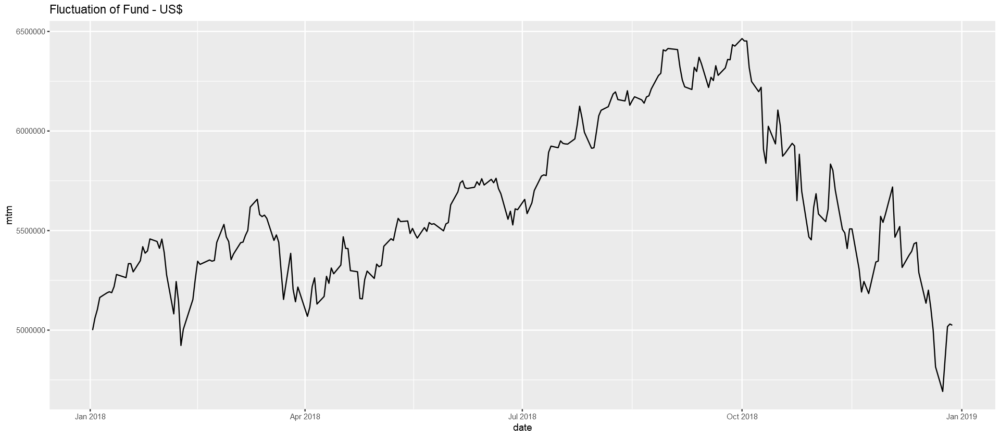

In [12]:
value_per_day$date = anytime(value_per_day$date)
ggplot(value_per_day, aes(x=date, y=mtm)) + geom_line() + 
    ggtitle("Fluctuation of Fund - US$")

**Next step is doing the rebalancing. But before that, we will add a column to our list of stocks with the day (market day) because we cannot simply count the difference between two dates, as we have weekends, holidays and other days when the stock market doesn't operate.**

In [13]:
stock_prices = stock_prices %>%
    arrange(rownames(stock_prices)) %>%
    mutate(day = row_number() - 1)
head(stock_prices)

,IBM_adj_close,IBM_close,MSFT_adj_close,MSFT_close,GOOG_adj_close,GOOG_close,AAPL_adj_close,AAPL_close,AMZN_adj_close,AMZN_close,...,FB_close,NFLX_adj_close,NFLX_close,TSLA_adj_close,TSLA_close,ORCL_adj_close,ORCL_close,SAP_adj_close,SAP_close,day
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2018-01-02,120.3420,147.4665,81.53024,85.95,1065.00,1065.00,41.13576,43.0650,1189.01,1189.01,...,181.42,201.07,201.07,64.106,64.106,43.50794,46.63,105.9143,112.39,0
2018-01-03,123.6499,151.5201,81.90965,86.35,1082.48,1082.48,41.12859,43.0575,1204.20,1204.20,...,184.67,205.05,205.05,63.450,63.450,44.51564,47.71,106.7813,113.31,1
2018-01-04,126.1543,154.5889,82.63058,87.11,1086.40,1086.40,41.31963,43.2575,1209.59,1209.59,...,184.33,205.63,205.63,62.924,62.924,44.95416,48.18,108.4210,115.05,2
2018-01-05,126.7706,155.3442,83.65506,88.19,1102.23,1102.23,41.79007,43.7500,1229.14,1229.14,...,186.85,209.99,209.99,63.316,63.316,45.22474,48.47,109.6273,116.33,3
2018-01-08,127.5351,156.2811,83.74043,88.28,1106.94,1106.94,41.63485,43.5875,1246.87,1246.87,...,188.28,212.05,212.05,67.282,67.282,45.70061,48.98,108.1854,114.80,4
2018-01-09,127.8160,156.6252,83.68349,88.22,1106.26,1106.26,41.63007,43.5825,1252.70,1252.70,...,187.87,209.31,209.31,66.738,66.738,45.95351,49.06,107.5823,114.16,5


**Now, let's create a function to get the** *n* **stocks with the lowest or highest changes on their value for a** *-t* **period of days considering one date as the starting point (and going backwards).**

In [14]:
get_stocks_per_change = function(stock_prices, date, n_stocks, t_days, type){
    day = stock_prices[date, "day"]
    stock_change = (stock_prices[stock_prices$day == day,] / 
                    stock_prices[stock_prices$day == (day - t_days),] - 1)
    stock_change = stock_change %>%
        select(ends_with("_adj_close")) %>%
        melt(id.vars = NULL) %>%
        rename(stock = variable, change=value) %>%
        mutate_at("stock", str_replace, "_adj_close", "")
    if (type == "low"){
        stock_change = suppressMessages(top_n(stock_change, -n_stocks))
    } else {
        stock_change = suppressMessages(top_n(stock_change, n_stocks))
    }
    stock_change[["stock"]]
}

date = "2018-01-11"
n_stocks = 5
t_days = 5
type = "low"
get_stocks_per_change(stock_prices, date, n_stocks, t_days, type)
t_days = 7
get_stocks_per_change(stock_prices, date, n_stocks, t_days, type)

[1] "IBM"  "MSFT" "GOOG" "AAPL" "SAP"

[1] "MSFT" "GOOG" "AAPL" "FB"   "SAP"

**Now that we have added the day column and created a function for getting the stocks according to their change, we can add the rebalancing code snippet to the script we created above that generate the value of our account per day according to the value of the stocks on our wallet on that day**

In [15]:
rebalancing_days = 5
type_of_rebalancing = "low"
account = buy_stocks(stock_prices, initial_funds, initial_stocks, initial_date)
for (each_day in rownames(stock_prices)){
    if (each_day == initial_date){next}
    
    current_wallet = account[account$date == max(account$date),]
    for (each_stock in current_wallet$stock){
        if (each_stock == "CASH"){
            current_wallet[current_wallet$stock=="CASH", "date"] = each_day
        }
        else{
            current_wallet[current_wallet$stock==each_stock, "date"] = each_day
            stock_name = paste(each_stock, "_close", sep="")
            current_price = full_stock[each_day, stock_name]
            
            current_wallet[current_wallet$stock==each_stock, "value"] = current_price * 
                current_wallet[current_wallet$stock==each_stock, "quantity"]
        }
    }
    
    if (stock_prices[each_day, "day"] %% rebalancing_days == 0){
        # Getting stocks with lowest change
        stocks = get_stocks_per_change(stock_prices, 
                                       date = each_day, 
                                       n_stocks = nrow(current_wallet) - 1, 
                                       t_days = rebalancing_days, 
                                       type = type_of_rebalancing)
        
        # Selling current stocks
        current_mtm = sum(current_wallet$value)
        print(paste("Rebalancing on:", each_day, " | Current MTM=", current_mtm, sep=""))        
        rm(current_wallet)
        current_wallet = buy_stocks(stock_prices, current_mtm, stocks, each_day)
    }    
    account = rbind(account, current_wallet)
    rm(current_wallet)
    rownames(account) = seq(length=nrow(account))
}
tail(account)

[1] "Rebalancing on:2018-01-09 | Current MTM=5192795.921684"
[1] "Rebalancing on:2018-01-17 | Current MTM=5184148.992772"
[1] "Rebalancing on:2018-01-24 | Current MTM=5339228.205859"
[1] "Rebalancing on:2018-01-31 | Current MTM=5352823.81766"
[1] "Rebalancing on:2018-02-07 | Current MTM=5065949.908569"
[1] "Rebalancing on:2018-02-14 | Current MTM=5118321.663166"
[1] "Rebalancing on:2018-02-22 | Current MTM=5231052.163002"
[1] "Rebalancing on:2018-03-01 | Current MTM=5211334.422871"
[1] "Rebalancing on:2018-03-08 | Current MTM=5414009.574154"
[1] "Rebalancing on:2018-03-15 | Current MTM=5442684.11401"
[1] "Rebalancing on:2018-03-22 | Current MTM=5044145.633715"
[1] "Rebalancing on:2018-03-29 | Current MTM=4846620.966593"
[1] "Rebalancing on:2018-04-06 | Current MTM=4878983.418733"
[1] "Rebalancing on:2018-04-13 | Current MTM=5062253.357461"
[1] "Rebalancing on:2018-04-20 | Current MTM=5122872.762113"
[1] "Rebalancing on:2018-04-27 | Current MTM=5162773.616925"
[1] "Rebalancing on:2018-0

,date,stock,quantity,value
,<chr>,<chr>,<dbl>,<dbl>
1495,2018-12-28,AAPL,26537.000,1036468.851
1496,2018-12-28,AMZN,725.000,1071564.515
1497,2018-12-28,FB,8003.000,1065999.576
1498,2018-12-28,NFLX,4058.000,1039172.587
1499,2018-12-28,TSLA,15636.000,1044078.295
1500,2018-12-28,CASH,1496.685,1496.685


**Let's check our performance when using the "5 days rebalancing of buying low" strategy**

In [16]:
value_per_day = account %>%
    group_by(date) %>%
    summarize(mtm = sum(value, na.rm = TRUE))
tail(value_per_day)

date,mtm
<chr>,<dbl>
2018-12-20,5189756
2018-12-21,4999939
2018-12-24,4815655
2018-12-26,5233588
2018-12-27,5199392
2018-12-28,5258781


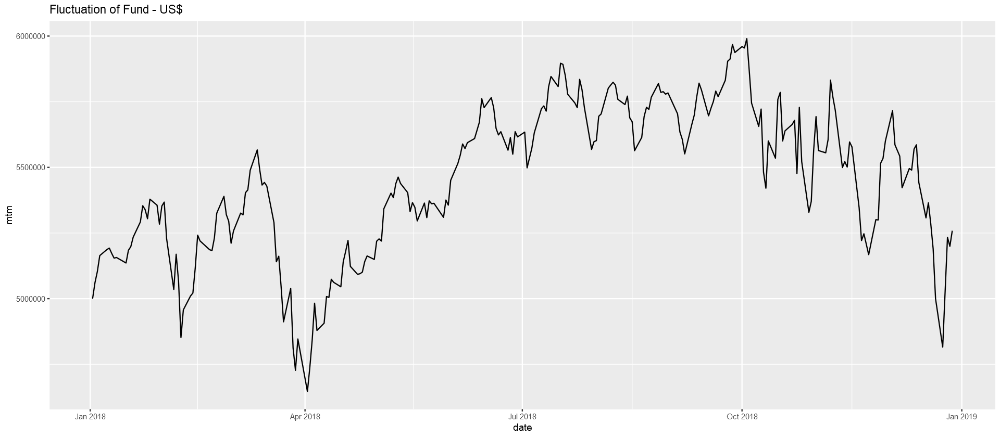

In [17]:
value_per_day$date = anytime(value_per_day$date)
ggplot(value_per_day, aes(x=date, y=mtm)) + geom_line() + 
    ggtitle("Fluctuation of Fund - US$")

**Let's see how is the behavior if we adopt a strategy of "5 days rebalancing of buying high"**

In [18]:
rebalancing_days = 5
type_of_rebalancing = "high"
account = buy_stocks(stock_prices, initial_funds, initial_stocks, initial_date)
for (each_day in rownames(stock_prices)){
    if (each_day == initial_date){next}
    
    current_wallet = account[account$date == max(account$date),]
    for (each_stock in current_wallet$stock){
        if (each_stock == "CASH"){
            current_wallet[current_wallet$stock=="CASH", "date"] = each_day
        }
        else{
            current_wallet[current_wallet$stock==each_stock, "date"] = each_day
            stock_name = paste(each_stock, "_close", sep="")
            current_price = full_stock[each_day, stock_name]
            
            current_wallet[current_wallet$stock==each_stock, "value"] = current_price * 
                current_wallet[current_wallet$stock==each_stock, "quantity"]
        }
    }
    
    if (stock_prices[each_day, "day"] %% rebalancing_days == 0){
        # Getting stocks with lowest change
        stocks = get_stocks_per_change(stock_prices, 
                                       date = each_day, 
                                       n_stocks = nrow(current_wallet) - 1, 
                                       t_days = rebalancing_days, 
                                       type = type_of_rebalancing)
        
        # Selling current stocks
        current_mtm = sum(current_wallet$value)      
        rm(current_wallet)
        current_wallet = buy_stocks(stock_prices, current_mtm, stocks, each_day)
        
    }    
    account = rbind(account, current_wallet)
    rm(current_wallet)
    rownames(account) = seq(length=nrow(account))
}
tail(account)

,date,stock,quantity,value
,<chr>,<chr>,<dbl>,<dbl>
1495,2018-12-28,IBM,8765.0000,947139.5278
1496,2018-12-28,MSFT,9464.0000,950090.9505
1497,2018-12-28,GOOG,949.0000,984188.8782
1498,2018-12-28,ORCL,21129.0000,947001.7800
1499,2018-12-28,SAP,9670.0000,959263.9710
1500,2018-12-28,CASH,245.2297,245.2297


In [19]:
value_per_day = account %>%
    group_by(date) %>%
    summarize(mtm = sum(value, na.rm = TRUE))
tail(value_per_day)

date,mtm
<chr>,<dbl>
2018-12-20,4831710
2018-12-21,4648454
2018-12-24,4539558
2018-12-26,4765266
2018-12-27,4809283
2018-12-28,4787930


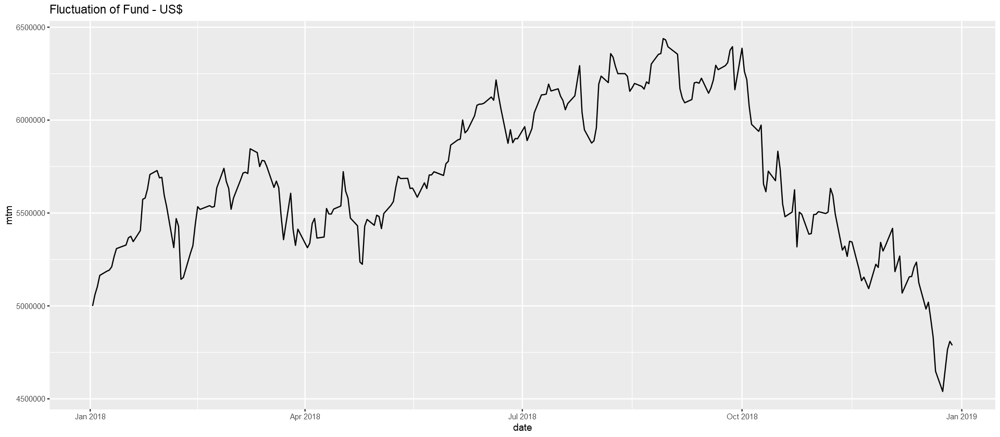

In [20]:
value_per_day$date = anytime(value_per_day$date)
ggplot(value_per_day, aes(x=date, y=mtm)) + geom_line() + 
    ggtitle("Fluctuation of Fund - US$")

**It looks like we would have performed worse with "5 days of buying high" than we would have done with "5 days of buying low" strategy.**

**Now, let's implement the issuing of dividends.**

## Step #3

Corporations generally issue stock dividends on some days. The total dividend you get on such a day is the stock dividend times your shares if you have shares of this stock on the dividend day. If you buy shares on the dividend day, these bought shares are not qualified to get dividend. If you sell shares on the dividend day, the sold shares are qualified to get dividend. For example, on 2/8/2018, IBM issued \\$1.5 dividend per share. In your cash account, you will automatically get

**First step is to get the days when dividends were issued and the dividend values per stock held. We have done this on a previous homework, so, let's re-use the code to generate a list of dividends per stock.**

In [21]:
dividends_issued = data.frame(
        stock = character(),
        date = character(),
        value = double(),
        stringsAsFactors=FALSE
    )

for (each_tkt in universe){
    file_name = paste(each_tkt, ".csv", sep="")
    dividends = read.csv(file_name) %>%
        arrange(Date) %>% 
        mutate(stock = each_tkt, RatioAdjClose = lag(Adj.Close) / Adj.Close, RatioClose = lag(Close) / Close) %>%
        mutate(difference = round(RatioAdjClose - RatioClose, 6)) %>%
        mutate(dividend = abs(difference * Close)) %>%
        select(stock, Date, dividend) %>%
        subset(dividend > 0)
    dividends_issued = rbind(dividends_issued, dividends)
    rm(dividends)
    rownames(dividends_issued) = seq(length=nrow(dividends_issued))
}
dividends_issued

,stock,Date,dividend
,<chr>,<chr>,<dbl>
1,IBM,2018-02-08,1.4339935
2,IBM,2018-05-09,1.5009497
3,IBM,2018-08-09,1.5009853
4,IBM,2018-11-08,1.5009660
5,MSFT,2018-02-14,0.4199962
6,MSFT,2018-05-16,0.4199795
7,MSFT,2018-08-15,0.4199817
8,MSFT,2018-11-14,0.4599785
9,AAPL,2018-02-09,0.1575049


**Next, we implement the logic to "credit" dividends if, on the day that dividend is issued, we hold the stock (and before rebalancing)**

In [22]:
rebalancing_days = 5
type_of_rebalancing = "low"
account = buy_stocks(stock_prices, initial_funds, initial_stocks, initial_date)
for (each_day in rownames(stock_prices)){
    if (each_day == initial_date){next}
    
    current_wallet = account[account$date == max(account$date),]
    for (each_stock in current_wallet$stock){
        if (each_stock == "CASH"){
            current_wallet[current_wallet$stock=="CASH", "date"] = each_day
        }
        else{
            current_wallet[current_wallet$stock==each_stock, "date"] = each_day
            stock_name = paste(each_stock, "_close", sep="")
            current_price = full_stock[each_day, stock_name]
            
            current_wallet[current_wallet$stock==each_stock, "value"] = current_price * 
                current_wallet[current_wallet$stock==each_stock, "quantity"]
        }
    }
    
    # Issuing dividends
    for (each_stock in current_wallet$stock){
        if (nrow(dividends_issued[dividends_issued$Date == each_day & dividends_issued$stock == each_stock,]) > 0){
            total_cash = current_wallet[current_wallet$stock=="CASH", "value"] + 
                current_wallet[current_wallet$stock==each_stock, "quantity"] * 
                dividends_issued[dividends_issued$Date == each_day & dividends_issued$stock == each_stock, 
                                 "dividend"]
            current_wallet[current_wallet$stock=="CASH", "quantity"] = total_cash
            current_wallet[current_wallet$stock=="CASH", "value"] = total_cash
        }
    }
    
    # Rebalancing
    if (stock_prices[each_day, "day"] %% rebalancing_days == 0){
        # Getting stocks with lowest change
        stocks = get_stocks_per_change(stock_prices, 
                                       date = each_day, 
                                       n_stocks = nrow(current_wallet) - 1, 
                                       t_days = rebalancing_days, 
                                       type = type_of_rebalancing)
        
        # Selling current stocks
        current_mtm = sum(current_wallet$value)      
        rm(current_wallet)
        current_wallet = buy_stocks(stock_prices, current_mtm, stocks, each_day)
        
    }    
    account = rbind(account, current_wallet)
    rm(current_wallet)
    rownames(account) = seq(length=nrow(account))
}
tail(account)

,date,stock,quantity,value
,<chr>,<chr>,<dbl>,<dbl>
1495,2018-12-28,AAPL,26852.000,1048771.963
1496,2018-12-28,AMZN,734.000,1084866.695
1497,2018-12-28,FB,8098.000,1078653.576
1498,2018-12-28,NFLX,4106.000,1051464.427
1499,2018-12-28,TSLA,15821.000,1056431.486
1500,2018-12-28,CASH,1093.404,1093.404


**Let's take a look on our performance, now considering the dividends**

In [23]:
value_per_day = account %>%
    group_by(date) %>%
    summarize(mtm = sum(value, na.rm = TRUE))
tail(value_per_day)

date,mtm
<chr>,<dbl>
2018-12-20,5251377
2018-12-21,5059331
2018-12-24,4872852
2018-12-26,5295789
2018-12-27,5261184
2018-12-28,5321282


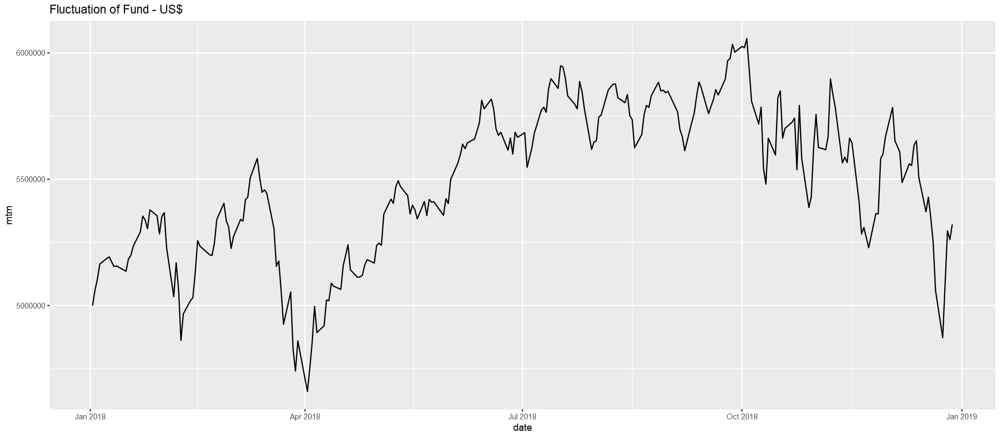

In [24]:
value_per_day$date = anytime(value_per_day$date)
ggplot(value_per_day, aes(x=date, y=mtm)) + geom_line() + 
    ggtitle("Fluctuation of Fund - US$")

## Step #4

5 business days later on Jan 17 (Jan 15 was a holiday), you re-check the market and adjust your portfolio again. You will have a new portfolio on Jan 17.


## Step #5

If you run this strategy every 5 days all the way to Dec 31 2018, you will have a daily MTM. You expect the MTM on Dec 31 2018 should be higher than $5m because you always buy the stocks that dropped the most, i.e., you always buy low.

## Step #6

Another strategy is "5 days rebalancing of buying high". You always buy the 5 stocks whose "Adj Close" prices surge the most interms of percentage because you believe the trend will continue. Run the new strategy and see how the MTM will change.

**Steps #4 and #5 were tackled when we created the Data Frame with the fluctuation of values. We have briefly checked how the "5 days rebalancing of buying high", but before we issue dividends. So, let's encapsulate our code on an function to make it easy to do some simulations.**

In [25]:
fund_performance = function(stock_prices, initial_funds, initial_stocks, initial_date, 
                            rebalancing_days, type_of_rebalancing){
    account = buy_stocks(stock_prices, initial_funds, initial_stocks, initial_date)
    for (each_day in rownames(stock_prices)){
        if (each_day == initial_date){next}

        current_wallet = account[account$date == max(account$date),]
        for (each_stock in current_wallet$stock){
            if (each_stock == "CASH"){
                current_wallet[current_wallet$stock=="CASH", "date"] = each_day
            }
            else{
                current_wallet[current_wallet$stock==each_stock, "date"] = each_day
                stock_name = paste(each_stock, "_close", sep="")
                current_price = full_stock[each_day, stock_name]

                current_wallet[current_wallet$stock==each_stock, "value"] = current_price * 
                    current_wallet[current_wallet$stock==each_stock, "quantity"]
            }
        }

        # Issuing dividends
        for (each_stock in current_wallet$stock){
            if (nrow(dividends_issued[dividends_issued$Date == each_day & 
                                      dividends_issued$stock == each_stock,]) > 0){
                total_cash = current_wallet[current_wallet$stock=="CASH", "value"] + 
                    current_wallet[current_wallet$stock==each_stock, "quantity"] * 
                    dividends_issued[dividends_issued$Date == each_day & dividends_issued$stock == each_stock, 
                                     "dividend"]
                current_wallet[current_wallet$stock=="CASH", "quantity"] = total_cash
                current_wallet[current_wallet$stock=="CASH", "value"] = total_cash
            }
        }

        if (stock_prices[each_day, "day"] %% rebalancing_days == 0){
            # Getting stocks with lowest change
            stocks = get_stocks_per_change(stock_prices, 
                                           date = each_day, 
                                           n_stocks = nrow(current_wallet) - 1, 
                                           t_days = rebalancing_days, 
                                           type = type_of_rebalancing)

            # Selling current stocks
            current_mtm = sum(current_wallet$value)      
            rm(current_wallet)
            current_wallet = buy_stocks(stock_prices, current_mtm, stocks, each_day)

        }    
        account = rbind(account, current_wallet)
        rm(current_wallet)
        rownames(account) = seq(length=nrow(account))
    }
    account
}

In [26]:
rebalancing_days = 5
type_of_rebalancing = "high"
initial_funds = 5000000
initial_stocks = c('IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN')
initial_date = "2018-01-02"
account = buy_stocks(stock_prices, initial_funds, initial_stocks, initial_date)
buy_high_5_days = suppressMessages(fund_performance(stock_prices, initial_funds, initial_stocks, initial_date, 
                            rebalancing_days, type_of_rebalancing))
tail(buy_high_5_days)

,date,stock,quantity,value
,<chr>,<chr>,<dbl>,<dbl>
1495,2018-12-28,IBM,8845.0000,955784.2697
1496,2018-12-28,MSFT,9550.0000,958724.4905
1497,2018-12-28,GOOG,957.0000,992485.5179
1498,2018-12-28,ORCL,21321.0000,955607.2200
1499,2018-12-28,SAP,9757.0000,967894.3707
1500,2018-12-28,CASH,858.7159,858.7159


In [27]:
buy_high_5_days_summary = buy_high_5_days %>%
    group_by(date) %>%
    summarize(mtm = sum(value, na.rm = TRUE))
tail(buy_high_5_days_summary)

date,mtm
<chr>,<dbl>
2018-12-20,4875573
2018-12-21,4690648
2018-12-24,4580766
2018-12-26,4808483
2018-12-27,4852898
2018-12-28,4831355


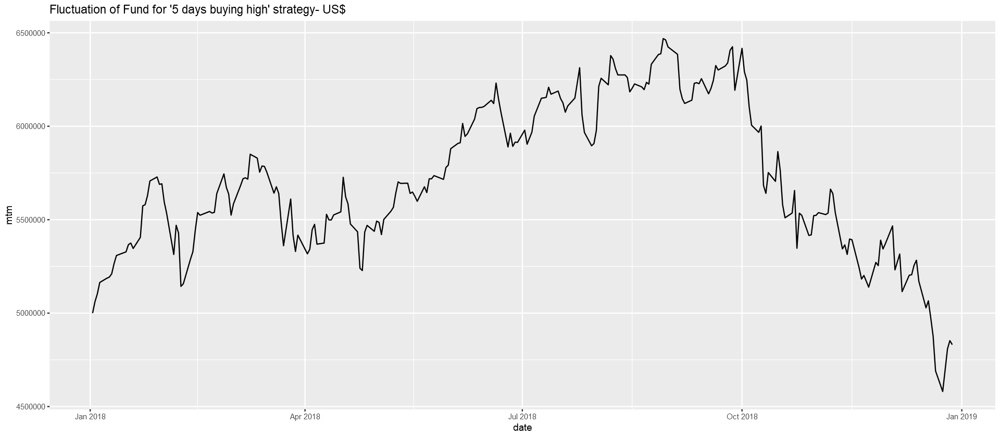

In [28]:
buy_high_5_days_summary$date = anytime(buy_high_5_days_summary$date)
ggplot(buy_high_5_days_summary, aes(x=date, y=mtm)) + geom_line() + 
    ggtitle("Fluctuation of Fund for '5 days buying high' strategy- US$")

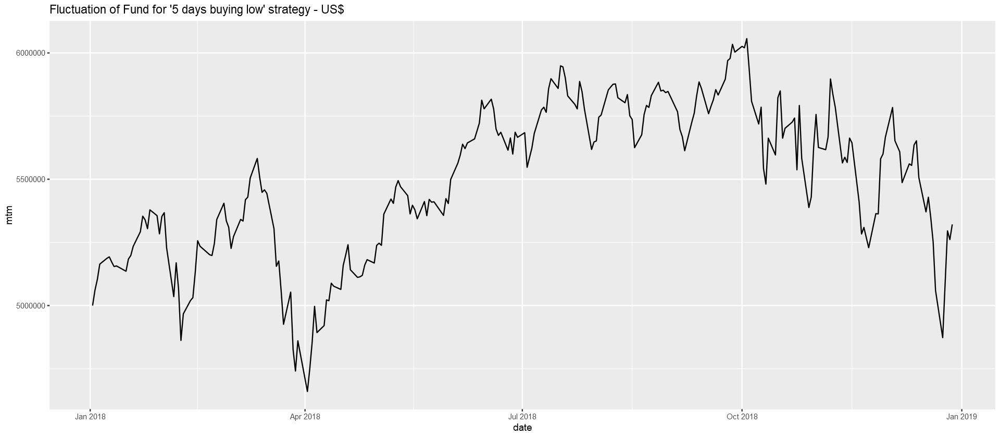

In [29]:
value_per_day$date = anytime(value_per_day$date)
ggplot(value_per_day, aes(x=date, y=mtm)) + geom_line() + 
    ggtitle("Fluctuation of Fund for '5 days buying low' strategy - US$")

## Step #7

You will create a "high tech index" which is simply the daily average of the 10 stocks "Close" prices. Compare your MTM series with the "high tech index" and plot their curves. To plot the two curves together, you may want to convert the series to daily percentage change with regard to Jan 02 2018.

**First we create a data frame for the index**

In [30]:
high_tech_index = stock_prices %>%
    select(-ends_with("_adj_close")) %>%
    select(-day)
high_tech_index = high_tech_index %>%
    mutate(average_price = rowMeans(select(high_tech_index, ends_with("_close")), na.rm = TRUE)) %>%
    select(average_price) %>%
    arrange(rownames(high_tech_index)) %>%
    mutate(date = rownames(high_tech_index), average_change = average_price / lag(average_price) - 1) %>%
    select(date, average_change)
head(high_tech_index)

,date,average_change
,<chr>,<dbl>
2018-01-02,2018-01-02,NA
2018-01-03,2018-01-03,0.0145690019
2018-01-04,2018-01-04,0.0047969445
2018-01-05,2018-01-05,0.0145601756
2018-01-08,2018-01-08,0.0091688984
2018-01-09,2018-01-09,0.0003590193


**We can now run our function using the parameters for '5 days of buying low' and adding the result to a data frame as well**

In [31]:
rebalancing_days = 5
type_of_rebalancing = "low"
initial_funds = 5000000
initial_stocks = c('IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN')
initial_date = "2018-01-02"
account = buy_stocks(stock_prices, initial_funds, initial_stocks, initial_date)
buy_low_5_days = suppressMessages(fund_performance(stock_prices, initial_funds, initial_stocks, initial_date, 
                            rebalancing_days, type_of_rebalancing))
tail(buy_low_5_days)

,date,stock,quantity,value
,<chr>,<chr>,<dbl>,<dbl>
1495,2018-12-28,AAPL,26852.000,1048771.963
1496,2018-12-28,AMZN,734.000,1084866.695
1497,2018-12-28,FB,8098.000,1078653.576
1498,2018-12-28,NFLX,4106.000,1051464.427
1499,2018-12-28,TSLA,15821.000,1056431.486
1500,2018-12-28,CASH,1093.404,1093.404


**We now create the summary (MTM) per day, but with the change from one day to another in terms of percentage.**

In [32]:
buy_low_5_days_summary = buy_low_5_days %>%
    group_by(date) %>%
    summarize(mtm = sum(value, na.rm = TRUE)) %>%
    arrange(date) %>%
    mutate(mtm_change = mtm / lag(mtm) - 1)
tail(buy_low_5_days_summary)

date,mtm,mtm_change
<chr>,<dbl>,<dbl>
2018-12-20,5251377,-0.018041103
2018-12-21,5059331,-0.036570676
2018-12-24,4872852,-0.036858387
2018-12-26,5295789,0.086794519
2018-12-27,5261184,-0.006534389
2018-12-28,5321282,0.011422801


**Then we create a data frame joining the index and our fund information**

In [33]:
performance_comparison = full_join(high_tech_index, buy_low_5_days_summary, by = "date")

**And we can finally plot on a chart**

Warning message:
"Removed 1 row(s) containing missing values (geom_path)."
Warning message:
"Removed 1 row(s) containing missing values (geom_path)."


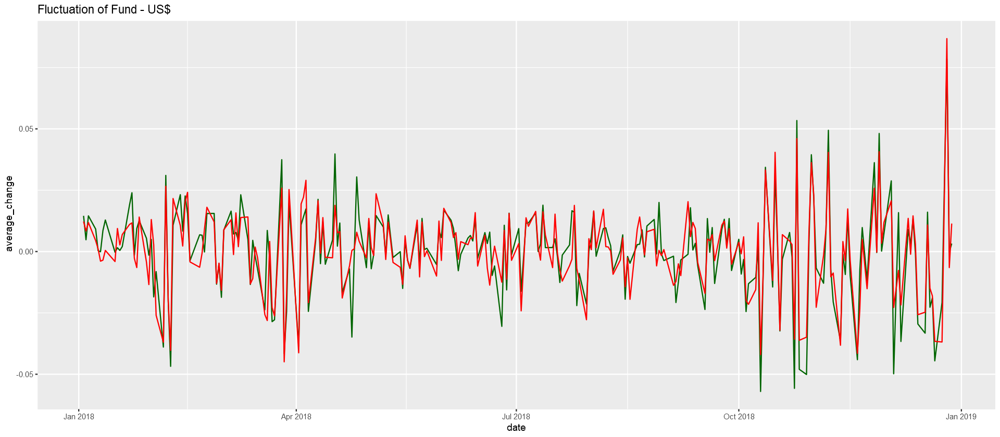

In [34]:
performance_comparison$date = anytime(performance_comparison$date)
ggplot(performance_comparison, aes(x=date)) + 
    geom_line(aes(y = average_change), color="darkgreen") + 
    geom_line(aes(y = mtm_change), color="red") + 
    ggtitle("Fluctuation of Fund - US$")

**Or we can create a more interative visualization**

In [35]:
plot_ly(performance_comparison, x = ~date, y = ~average_change, 
        name = "High Tech Index", type = "scatter", mode = "lines") %>%
add_trace(y = ~mtm_change, name = "5 days buying low", type = "scatter", mode = "lines") %>%
layout(title = "Fluctuation of Fund with '5 days of buying low' strategy vs High Tech Index",
       xaxis = list(title = "Date"),
       yaxis = list(title = "Change"))

HTML widgets cannot be represented in plain text (need html)

## Step #8

Download the USD/JPY 2018 historical data at https://www.myfxbook.com/en/forex-market/currencies/USDJPY-historical-data then use the "Close" column as the rate to convert your MTM series from USD to JPY. Plot the two MTM curves. You will need to convert to daily percentage change too.

**We first download the currency rates between USD and JPY for 2018. In order to make sure we will have rates for everyday we will have MTM, we will fill currency rates for every day of 2018 using the previous value for any date we may not have value.**

In [36]:
USDJPY = suppressMessages(read_csv(paste(
    "https://query1.finance.yahoo.com/v7/finance/download/JPY=X?",
    "period1=1514764800&period2=1546214400&interval=1d&events=history&includeAdjustedClose=true", sep = "")))
usd_jpy = data.frame(Date = seq(min(USDJPY$Date), max(USDJPY$Date), by="days")) %>%
    left_join(USDJPY, on="Date") %>%
    select(Date, Close) %>%
    fill(Close, .direction = "down") %>%
    rename(date = Date, jpy_close = Close)
tail(usd_jpy)

Joining, by = "Date"


,date,jpy_close
,<date>,<dbl>
360,2018-12-26,110.402
361,2018-12-27,111.206
362,2018-12-28,110.855
363,2018-12-29,110.855
364,2018-12-30,110.855
365,2018-12-31,110.330


**And we create a dataframe comparing our MTM in USD and JPY for each day, as we were investing our money on another currency and comparing not just the change on our stock prices, but also the variation of the currency relationship**

In [37]:
usd_vs_jpy_comparison = buy_low_5_days_summary %>%
    mutate(date = as.Date(date), mtm = as.numeric(mtm)) %>%
    inner_join(usd_jpy, on = "date") %>%
    mutate(mtm_jpy = mtm * jpy_close) %>%
    arrange(date) %>%
    mutate(mtm_jpy_change = mtm_jpy / lag(mtm_jpy) - 1)
tail(usd_vs_jpy_comparison)

Joining, by = "date"


date,mtm,mtm_change,jpy_close,mtm_jpy,mtm_jpy_change
<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2018-12-20,5251377,-0.018041103,112.410,590307329,-0.0190359252
2018-12-21,5059331,-0.036570676,111.171,562450850,-0.0471897904
2018-12-24,4872852,-0.036858387,111.054,541149710,-0.0378720024
2018-12-26,5295789,0.086794519,110.402,584665679,0.0804139194
2018-12-27,5261184,-0.006534389,111.206,585075243,0.0007005099
2018-12-28,5321282,0.011422801,110.855,589890682,0.0082304610


In [38]:
plot_ly(usd_vs_jpy_comparison, x = ~date, y = ~mtm_change, 
        name = "5 days buying low - USD", type = "scatter", mode = "lines") %>%
add_trace(y = ~mtm_jpy_change, name = "5 days buying low - JPY", type = "scatter", mode = "lines") %>%
layout(title = "Fluctuation of Fund with '5 days of buying low' USD vs JPY",
       xaxis = list(title = "Date"),
       yaxis = list(title = "Change"))

HTML widgets cannot be represented in plain text (need html)

## Step #9

The above two strategies both rebalance every 5 days. Try to change the days interval and find the optimal days interval that maximizes the MTM on 12/31/2018.

**We are going to do some simulations for potential combinations of days (from 1 to 10) for rebalancing and for two strategies (buying low and high)**

In [39]:
rebalancing_days = 1:10
type_of_rebalancing = c("low", "high")
initial_funds = 5000000
initial_stocks = c('IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN')
initial_date = "2018-01-02"
simulations = data.frame(
    rebalancing_days = double(),
    strategy = character(),
    mtm = double(),
    stringsAsFactors=FALSE
)
for (each_rebalancing_days in rebalancing_days){
    for (each_type_of_rebalancing in type_of_rebalancing){
        simulation = suppressMessages(fund_performance(stock_prices, initial_funds, initial_stocks, initial_date, 
                                                       each_rebalancing_days, each_type_of_rebalancing))
        simulation = simulation %>%
            filter(date == "2018-12-28") %>%
            group_by(date) %>%
            summarize(mtm = sum(value, na.rm = TRUE))
        simulations = simulations %>%
            add_row(rebalancing_days = each_rebalancing_days, 
                    strategy = each_type_of_rebalancing, 
                    mtm = simulation[["mtm"]])
        rm(simulation)
        print(paste(each_rebalancing_days, " days of buying ", each_type_of_rebalancing, sep=""))
    }
}

[1] "1 days of buying low"
[1] "1 days of buying high"
[1] "2 days of buying low"
[1] "2 days of buying high"
[1] "3 days of buying low"
[1] "3 days of buying high"
[1] "4 days of buying low"
[1] "4 days of buying high"
[1] "5 days of buying low"
[1] "5 days of buying high"
[1] "6 days of buying low"
[1] "6 days of buying high"
[1] "7 days of buying low"
[1] "7 days of buying high"
[1] "8 days of buying low"
[1] "8 days of buying high"
[1] "9 days of buying low"
[1] "9 days of buying high"
[1] "10 days of buying low"
[1] "10 days of buying high"


In [40]:
simulations %>%
    arrange(desc(mtm)) %>%
    mutate(change = (mtm / initial_funds) - 1)

rebalancing_days,strategy,mtm,change
<dbl>,<chr>,<dbl>,<dbl>
8,low,5846805,0.169360929
4,low,5733406,0.146681292
10,low,5382703,0.076540535
5,low,5321282,0.064256310
1,high,5299548,0.059909518
9,low,5271139,0.054227739
7,high,5212304,0.042460721
6,high,5183420,0.036683904
3,high,5173077,0.034615391


**We can see above that our best approach would be buying low with an interval of 8 days, with around 17% of gains for the whole year. We could also have attempted to change the number of stocks on our wallet and the initial composition of them, but we would probably end up with thousands of possible permutations, which would require more computing power to do the simulation**